# Deep Convolutional GANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [1]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [2]:
!mkdir data

Ya existe el subdirectorio o el archivo data.


## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [3]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Testing Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [4]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

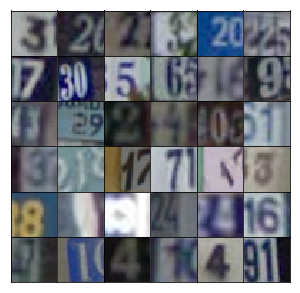

In [5]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [6]:
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [7]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(dataset.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), y

## Network Inputs

Here, just creating some placeholders like normal.

In [8]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    return inputs_real, inputs_z

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3.

In [9]:
def generator(z, output_dim, reuse=False, alpha=0.2, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        x1 = tf.layers.dense(z, 4*4*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 4, 4, 512))
        x1 = tf.layers.batch_normalization(x1, training=training)
        x1 = tf.maximum(alpha * x1, x1)
        # 4x4x512 now
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=training)
        x2 = tf.maximum(alpha * x2, x2)
        # 8x8x256 now
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=training)
        x3 = tf.maximum(alpha * x3, x3)
        # 16x16x128 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, output_dim, 5, strides=2, padding='same')
        # 32x32x3 now
        
        out = tf.tanh(logits)
        
        return out

## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've build before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU. 

Note: in this project, your batch normalization layers will always use batch statistics. (That is, always set `training` to `True`.) That's because we are only interested in using the discriminator to help train the generator. However, if you wanted to use the discriminator for inference later, then you would need to set the `training` parameter appropriately.

In [10]:
def discriminator(x, reuse=False, alpha=0.2):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        x1 = tf.layers.conv2d(x, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        # 16x16x64
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 8x8x128
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits

## Model Loss

Calculating the loss like before, nothing new here.

In [11]:
def model_loss(input_real, input_z, output_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, output_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

## Optimizers

Not much new here, but notice how the train operations are wrapped in a `with tf.control_dependencies` block so the batch normalization layers can update their population statistics.

In [12]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

## Building the model

Here we can use the functions we defined about to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [13]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha=0.2, beta1=0.5):
        tf.reset_default_graph()
        
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z,
                                              real_size[2], alpha=0.2)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, beta1)

Here is a function for displaying generated images.

In [14]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network. Notice when we call `generator` to create the samples to display, we set `training` to `False`. That's so the batch normalization layers will use the population statistics rather than the batch statistics. Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. The generator doesn't actually use it, but we'd get an error without it because of the `tf.control_dependencies` block we created in `model_opt`. 

In [15]:
def train(net, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5)):
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(72, z_size))

    samples, losses = [], []
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for x, y in dataset.batches(batch_size):
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))

                # Run optimizers
                _ = sess.run(net.d_opt, feed_dict={net.input_real: x, net.input_z: batch_z})
                _ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z, net.input_real: x})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: x})
                    train_loss_g = net.g_loss.eval({net.input_z: batch_z})

                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    gen_samples = sess.run(
                                   generator(net.input_z, 3, reuse=True, training=False),
                                   feed_dict={net.input_z: sample_z})
                    samples.append(gen_samples)
                    _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()

        saver.save(sess, './checkpoints/generator.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very sensitive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

In [ ]:
real_size = (32,32,3)
z_size = 100
learning_rate = 0.0002
batch_size = 128
epochs = 25
alpha = 0.2
beta1 = 0.5

# Create the network
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1)

Epoch 1/25... Discriminator Loss: 1.1561... Generator Loss: 0.9224
Epoch 1/25... Discriminator Loss: 0.6074... Generator Loss: 1.1803
Epoch 1/25... Discriminator Loss: 0.1978... Generator Loss: 2.1731
Epoch 1/25... Discriminator Loss: 0.1607... Generator Loss: 2.6447
Epoch 1/25... Discriminator Loss: 0.1518... Generator Loss: 2.9433
Epoch 1/25... Discriminator Loss: 0.1268... Generator Loss: 2.7775
Epoch 1/25... Discriminator Loss: 0.1713... Generator Loss: 2.3766
Epoch 1/25... Discriminator Loss: 0.2420... Generator Loss: 7.3855
Epoch 1/25... Discriminator Loss: 0.0910... Generator Loss: 5.1551
Epoch 1/25... Discriminator Loss: 0.2806... Generator Loss: 2.2329


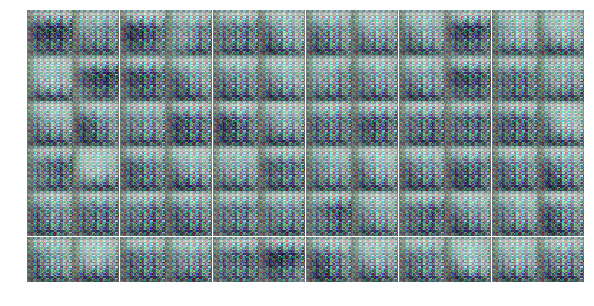

Epoch 1/25... Discriminator Loss: 0.2612... Generator Loss: 3.3834
Epoch 1/25... Discriminator Loss: 0.9931... Generator Loss: 0.7379
Epoch 1/25... Discriminator Loss: 0.4774... Generator Loss: 1.8467
Epoch 1/25... Discriminator Loss: 0.5207... Generator Loss: 1.4988
Epoch 1/25... Discriminator Loss: 0.6809... Generator Loss: 1.0990
Epoch 1/25... Discriminator Loss: 0.4835... Generator Loss: 2.0168
Epoch 1/25... Discriminator Loss: 0.3246... Generator Loss: 1.7634
Epoch 1/25... Discriminator Loss: 0.4602... Generator Loss: 1.5944
Epoch 1/25... Discriminator Loss: 0.3648... Generator Loss: 1.9142
Epoch 1/25... Discriminator Loss: 0.3361... Generator Loss: 2.2750


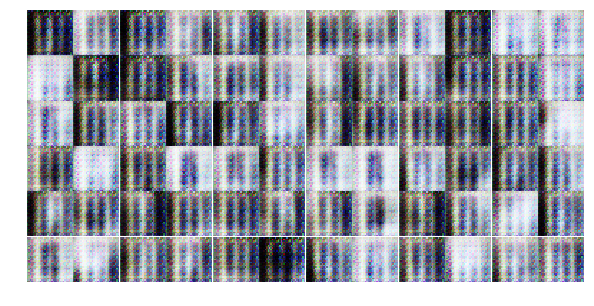

Epoch 1/25... Discriminator Loss: 0.3600... Generator Loss: 1.7699
Epoch 1/25... Discriminator Loss: 0.9099... Generator Loss: 0.7638
Epoch 1/25... Discriminator Loss: 0.4248... Generator Loss: 2.5584
Epoch 1/25... Discriminator Loss: 0.1001... Generator Loss: 3.7345
Epoch 1/25... Discriminator Loss: 0.2058... Generator Loss: 3.4121
Epoch 1/25... Discriminator Loss: 0.9809... Generator Loss: 3.7789
Epoch 1/25... Discriminator Loss: 0.9400... Generator Loss: 0.9515
Epoch 1/25... Discriminator Loss: 1.0426... Generator Loss: 1.1815
Epoch 1/25... Discriminator Loss: 1.1148... Generator Loss: 1.3213
Epoch 1/25... Discriminator Loss: 0.8012... Generator Loss: 1.6204


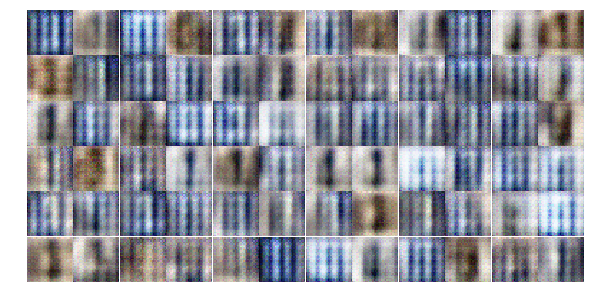

Epoch 1/25... Discriminator Loss: 0.8530... Generator Loss: 1.3307
Epoch 1/25... Discriminator Loss: 0.9590... Generator Loss: 1.0262
Epoch 1/25... Discriminator Loss: 0.5994... Generator Loss: 1.5792
Epoch 1/25... Discriminator Loss: 0.8223... Generator Loss: 1.2157
Epoch 1/25... Discriminator Loss: 0.3773... Generator Loss: 2.1482
Epoch 1/25... Discriminator Loss: 0.2624... Generator Loss: 2.7653
Epoch 1/25... Discriminator Loss: 0.5319... Generator Loss: 2.9253
Epoch 1/25... Discriminator Loss: 0.4266... Generator Loss: 3.5597
Epoch 1/25... Discriminator Loss: 0.2928... Generator Loss: 2.3070
Epoch 1/25... Discriminator Loss: 0.8803... Generator Loss: 1.0443


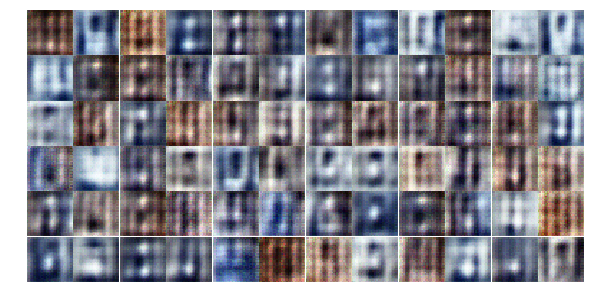

Epoch 1/25... Discriminator Loss: 0.3863... Generator Loss: 2.1032
Epoch 1/25... Discriminator Loss: 0.3194... Generator Loss: 1.9298
Epoch 1/25... Discriminator Loss: 0.5384... Generator Loss: 1.2241
Epoch 1/25... Discriminator Loss: 0.1570... Generator Loss: 4.0805
Epoch 1/25... Discriminator Loss: 1.1706... Generator Loss: 1.5692
Epoch 1/25... Discriminator Loss: 0.8625... Generator Loss: 0.9662
Epoch 1/25... Discriminator Loss: 0.6023... Generator Loss: 1.8386
Epoch 1/25... Discriminator Loss: 0.4180... Generator Loss: 1.8352
Epoch 1/25... Discriminator Loss: 0.8839... Generator Loss: 0.8421
Epoch 1/25... Discriminator Loss: 0.2798... Generator Loss: 1.9524


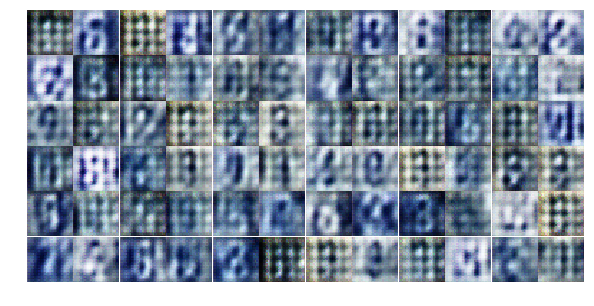

Epoch 1/25... Discriminator Loss: 0.5544... Generator Loss: 1.5118
Epoch 1/25... Discriminator Loss: 1.1328... Generator Loss: 0.9749
Epoch 1/25... Discriminator Loss: 0.5047... Generator Loss: 2.4091
Epoch 1/25... Discriminator Loss: 0.8153... Generator Loss: 0.9484
Epoch 1/25... Discriminator Loss: 0.6155... Generator Loss: 1.5528
Epoch 1/25... Discriminator Loss: 0.6761... Generator Loss: 1.0513
Epoch 1/25... Discriminator Loss: 1.0625... Generator Loss: 0.8581
Epoch 2/25... Discriminator Loss: 0.5388... Generator Loss: 1.9271
Epoch 2/25... Discriminator Loss: 0.4384... Generator Loss: 2.7593
Epoch 2/25... Discriminator Loss: 0.6298... Generator Loss: 1.1645


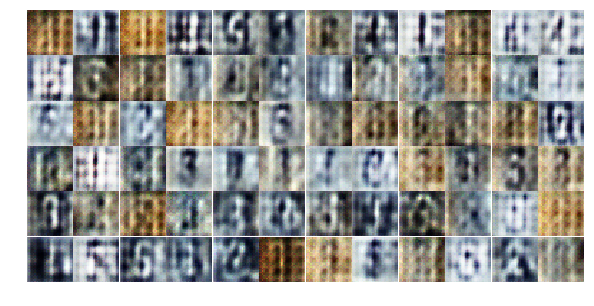

Epoch 2/25... Discriminator Loss: 0.3379... Generator Loss: 2.7945
Epoch 2/25... Discriminator Loss: 0.5069... Generator Loss: 1.5105
Epoch 2/25... Discriminator Loss: 0.9623... Generator Loss: 1.2267
Epoch 2/25... Discriminator Loss: 0.5363... Generator Loss: 3.7956
Epoch 2/25... Discriminator Loss: 0.2570... Generator Loss: 3.7062
Epoch 2/25... Discriminator Loss: 1.1477... Generator Loss: 0.8990
Epoch 2/25... Discriminator Loss: 1.0527... Generator Loss: 0.8688
Epoch 2/25... Discriminator Loss: 1.0015... Generator Loss: 0.9146
Epoch 2/25... Discriminator Loss: 1.6579... Generator Loss: 4.4515
Epoch 2/25... Discriminator Loss: 0.6376... Generator Loss: 1.4515


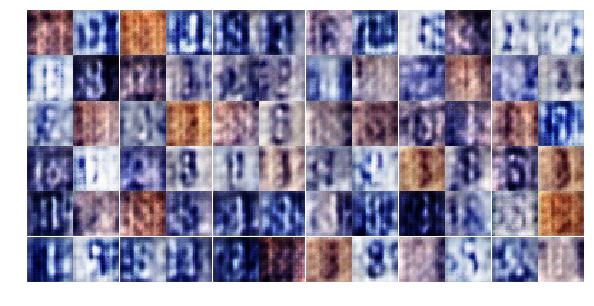

Epoch 2/25... Discriminator Loss: 1.1757... Generator Loss: 2.6816
Epoch 2/25... Discriminator Loss: 0.5334... Generator Loss: 1.4291
Epoch 2/25... Discriminator Loss: 0.9651... Generator Loss: 2.7659
Epoch 2/25... Discriminator Loss: 0.7339... Generator Loss: 1.2264
Epoch 2/25... Discriminator Loss: 0.8748... Generator Loss: 3.1136
Epoch 2/25... Discriminator Loss: 0.6837... Generator Loss: 1.6539
Epoch 2/25... Discriminator Loss: 1.0472... Generator Loss: 1.6235
Epoch 2/25... Discriminator Loss: 0.6775... Generator Loss: 1.5027
Epoch 2/25... Discriminator Loss: 0.5352... Generator Loss: 1.5618
Epoch 2/25... Discriminator Loss: 1.1455... Generator Loss: 0.7568


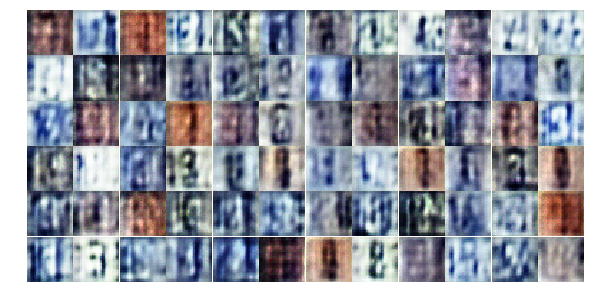

Epoch 2/25... Discriminator Loss: 0.7939... Generator Loss: 2.7250
Epoch 2/25... Discriminator Loss: 0.5039... Generator Loss: 1.5172
Epoch 2/25... Discriminator Loss: 1.0091... Generator Loss: 0.6426
Epoch 2/25... Discriminator Loss: 1.7337... Generator Loss: 4.5079
Epoch 2/25... Discriminator Loss: 0.7794... Generator Loss: 1.1931
Epoch 2/25... Discriminator Loss: 0.6290... Generator Loss: 1.4895
Epoch 2/25... Discriminator Loss: 0.6335... Generator Loss: 1.4007
Epoch 2/25... Discriminator Loss: 1.2172... Generator Loss: 0.6324
Epoch 2/25... Discriminator Loss: 1.0496... Generator Loss: 0.6794
Epoch 2/25... Discriminator Loss: 0.6479... Generator Loss: 1.2257


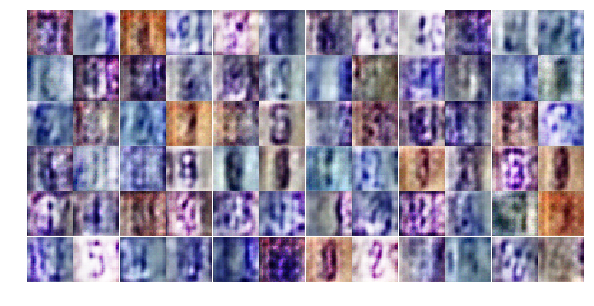

Epoch 2/25... Discriminator Loss: 0.6758... Generator Loss: 1.0591
Epoch 2/25... Discriminator Loss: 1.1533... Generator Loss: 0.9410
Epoch 2/25... Discriminator Loss: 1.5733... Generator Loss: 0.5144
Epoch 2/25... Discriminator Loss: 0.9216... Generator Loss: 0.7664
Epoch 2/25... Discriminator Loss: 0.7848... Generator Loss: 1.4862
Epoch 2/25... Discriminator Loss: 0.9556... Generator Loss: 2.3341
Epoch 2/25... Discriminator Loss: 1.3075... Generator Loss: 0.6618
Epoch 2/25... Discriminator Loss: 1.1619... Generator Loss: 2.7618
Epoch 2/25... Discriminator Loss: 1.1714... Generator Loss: 0.7123
Epoch 2/25... Discriminator Loss: 0.4224... Generator Loss: 1.5834


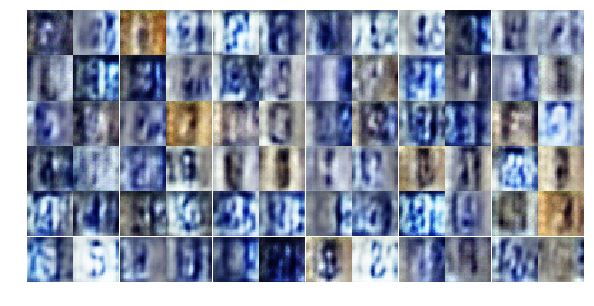

Epoch 2/25... Discriminator Loss: 0.4641... Generator Loss: 2.8572
Epoch 2/25... Discriminator Loss: 0.9600... Generator Loss: 0.9555
Epoch 2/25... Discriminator Loss: 0.4021... Generator Loss: 1.9181
Epoch 2/25... Discriminator Loss: 0.6760... Generator Loss: 1.1429
Epoch 2/25... Discriminator Loss: 0.6964... Generator Loss: 1.3615
Epoch 2/25... Discriminator Loss: 1.0796... Generator Loss: 0.6587
Epoch 2/25... Discriminator Loss: 0.4174... Generator Loss: 1.7596
Epoch 2/25... Discriminator Loss: 1.4430... Generator Loss: 2.0397
Epoch 2/25... Discriminator Loss: 0.6133... Generator Loss: 2.1446
Epoch 2/25... Discriminator Loss: 0.5573... Generator Loss: 1.3419


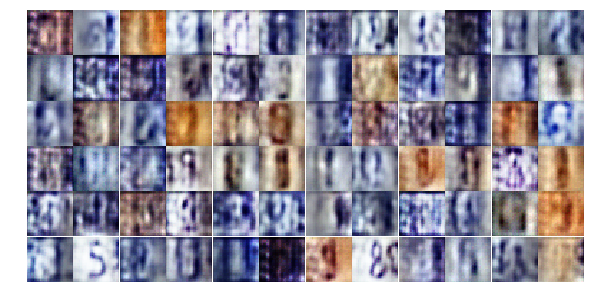

Epoch 2/25... Discriminator Loss: 0.8738... Generator Loss: 0.8219
Epoch 2/25... Discriminator Loss: 0.6313... Generator Loss: 1.2960
Epoch 2/25... Discriminator Loss: 0.6306... Generator Loss: 1.6793
Epoch 2/25... Discriminator Loss: 0.8216... Generator Loss: 2.1371
Epoch 3/25... Discriminator Loss: 0.3406... Generator Loss: 3.8035
Epoch 3/25... Discriminator Loss: 0.8775... Generator Loss: 0.9286
Epoch 3/25... Discriminator Loss: 0.6224... Generator Loss: 1.2218
Epoch 3/25... Discriminator Loss: 0.4574... Generator Loss: 1.6222
Epoch 3/25... Discriminator Loss: 0.3414... Generator Loss: 2.6631
Epoch 3/25... Discriminator Loss: 0.4490... Generator Loss: 3.3133


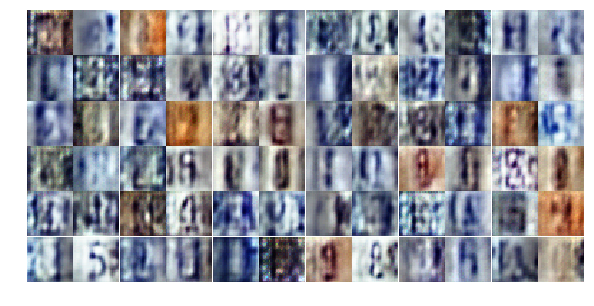

Epoch 3/25... Discriminator Loss: 0.5026... Generator Loss: 1.4927
Epoch 3/25... Discriminator Loss: 0.4469... Generator Loss: 1.4789
Epoch 3/25... Discriminator Loss: 0.4066... Generator Loss: 3.3354
Epoch 3/25... Discriminator Loss: 0.8422... Generator Loss: 1.0140
Epoch 3/25... Discriminator Loss: 0.6981... Generator Loss: 1.6587
Epoch 3/25... Discriminator Loss: 0.7750... Generator Loss: 0.9470
Epoch 3/25... Discriminator Loss: 0.7344... Generator Loss: 0.9712
Epoch 3/25... Discriminator Loss: 0.4250... Generator Loss: 1.8084
Epoch 3/25... Discriminator Loss: 0.3698... Generator Loss: 1.8139
Epoch 3/25... Discriminator Loss: 1.4571... Generator Loss: 0.3686


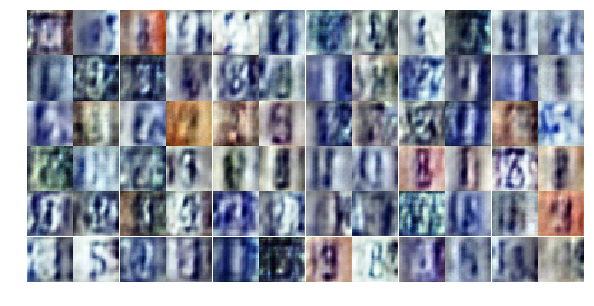

Epoch 3/25... Discriminator Loss: 0.4330... Generator Loss: 1.9396
Epoch 3/25... Discriminator Loss: 0.6197... Generator Loss: 1.3351
Epoch 3/25... Discriminator Loss: 0.3386... Generator Loss: 2.5836
Epoch 3/25... Discriminator Loss: 0.2464... Generator Loss: 3.7543
Epoch 3/25... Discriminator Loss: 0.7367... Generator Loss: 0.9272
Epoch 3/25... Discriminator Loss: 0.3791... Generator Loss: 1.9186
Epoch 3/25... Discriminator Loss: 1.3986... Generator Loss: 0.3357
Epoch 3/25... Discriminator Loss: 0.7494... Generator Loss: 3.1225
Epoch 3/25... Discriminator Loss: 0.5966... Generator Loss: 1.2105
Epoch 3/25... Discriminator Loss: 0.3532... Generator Loss: 2.6164


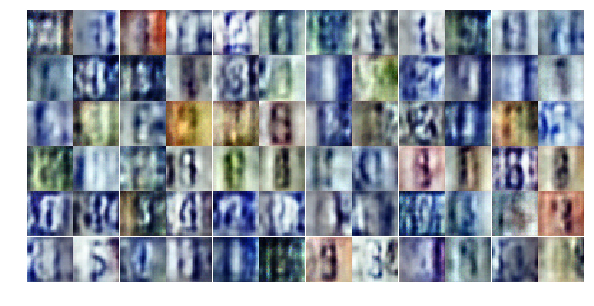

Epoch 3/25... Discriminator Loss: 0.3001... Generator Loss: 2.5447
Epoch 3/25... Discriminator Loss: 0.5277... Generator Loss: 1.7877
Epoch 3/25... Discriminator Loss: 0.4015... Generator Loss: 1.5322
Epoch 3/25... Discriminator Loss: 0.5186... Generator Loss: 1.1918
Epoch 3/25... Discriminator Loss: 0.6910... Generator Loss: 3.0490
Epoch 3/25... Discriminator Loss: 0.7306... Generator Loss: 0.8532
Epoch 3/25... Discriminator Loss: 0.7932... Generator Loss: 1.3901
Epoch 3/25... Discriminator Loss: 0.9885... Generator Loss: 0.7813
Epoch 3/25... Discriminator Loss: 0.8418... Generator Loss: 2.8492
Epoch 3/25... Discriminator Loss: 1.2015... Generator Loss: 0.5362


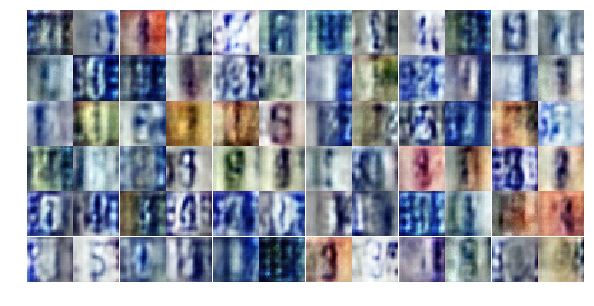

Epoch 3/25... Discriminator Loss: 0.5027... Generator Loss: 1.2770
Epoch 3/25... Discriminator Loss: 0.2139... Generator Loss: 3.3072
Epoch 3/25... Discriminator Loss: 0.7477... Generator Loss: 0.9548
Epoch 3/25... Discriminator Loss: 0.3164... Generator Loss: 2.4264
Epoch 3/25... Discriminator Loss: 0.4790... Generator Loss: 1.6023
Epoch 3/25... Discriminator Loss: 1.4686... Generator Loss: 3.3892
Epoch 3/25... Discriminator Loss: 0.7041... Generator Loss: 1.9378
Epoch 3/25... Discriminator Loss: 0.5498... Generator Loss: 1.3017
Epoch 3/25... Discriminator Loss: 0.9548... Generator Loss: 3.4409
Epoch 3/25... Discriminator Loss: 0.7934... Generator Loss: 2.8303


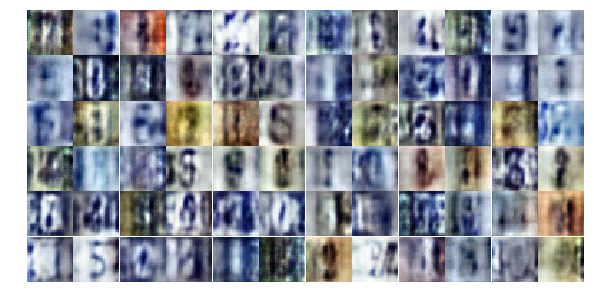

Epoch 3/25... Discriminator Loss: 0.9833... Generator Loss: 1.0023
Epoch 3/25... Discriminator Loss: 0.6871... Generator Loss: 1.1378
Epoch 3/25... Discriminator Loss: 0.5449... Generator Loss: 1.3090
Epoch 3/25... Discriminator Loss: 0.4889... Generator Loss: 1.7719
Epoch 3/25... Discriminator Loss: 0.5277... Generator Loss: 1.3147
Epoch 3/25... Discriminator Loss: 0.3931... Generator Loss: 1.9714
Epoch 3/25... Discriminator Loss: 0.7268... Generator Loss: 1.2886
Epoch 3/25... Discriminator Loss: 0.5524... Generator Loss: 1.6928
Epoch 3/25... Discriminator Loss: 0.5572... Generator Loss: 1.2251
Epoch 3/25... Discriminator Loss: 0.3969... Generator Loss: 2.3055


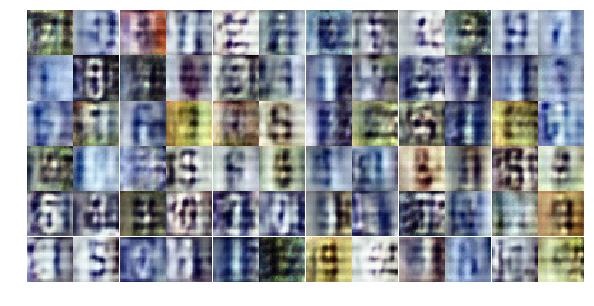

Epoch 3/25... Discriminator Loss: 1.2293... Generator Loss: 0.4763
Epoch 4/25... Discriminator Loss: 0.5947... Generator Loss: 1.2454
Epoch 4/25... Discriminator Loss: 0.6236... Generator Loss: 1.3733
Epoch 4/25... Discriminator Loss: 1.0170... Generator Loss: 0.6085
Epoch 4/25... Discriminator Loss: 0.6092... Generator Loss: 2.9256
Epoch 4/25... Discriminator Loss: 0.3984... Generator Loss: 2.3229
Epoch 4/25... Discriminator Loss: 0.7740... Generator Loss: 1.1411
Epoch 4/25... Discriminator Loss: 0.5634... Generator Loss: 1.8762
Epoch 4/25... Discriminator Loss: 0.5964... Generator Loss: 1.1974
Epoch 4/25... Discriminator Loss: 1.9526... Generator Loss: 0.3111


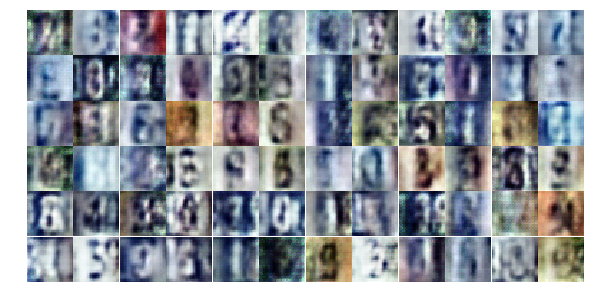

Epoch 4/25... Discriminator Loss: 0.7898... Generator Loss: 1.1266
Epoch 4/25... Discriminator Loss: 0.7108... Generator Loss: 1.3587
Epoch 4/25... Discriminator Loss: 0.6068... Generator Loss: 1.2536
Epoch 4/25... Discriminator Loss: 0.6696... Generator Loss: 1.0730
Epoch 4/25... Discriminator Loss: 0.5764... Generator Loss: 1.3592
Epoch 4/25... Discriminator Loss: 1.2888... Generator Loss: 0.5454
Epoch 4/25... Discriminator Loss: 0.8842... Generator Loss: 0.8482
Epoch 4/25... Discriminator Loss: 0.4715... Generator Loss: 1.3769
Epoch 4/25... Discriminator Loss: 0.4472... Generator Loss: 1.7221
Epoch 4/25... Discriminator Loss: 0.5356... Generator Loss: 1.5077


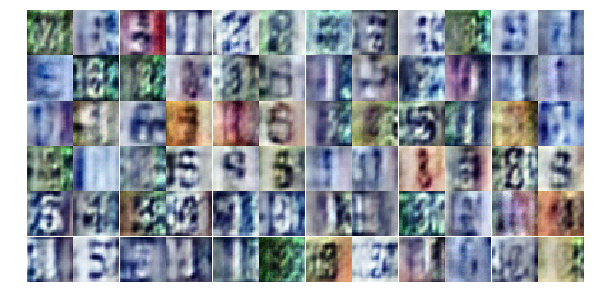

Epoch 4/25... Discriminator Loss: 0.4443... Generator Loss: 1.9936
Epoch 4/25... Discriminator Loss: 0.4404... Generator Loss: 2.2301
Epoch 4/25... Discriminator Loss: 0.3919... Generator Loss: 1.7209
Epoch 4/25... Discriminator Loss: 0.4855... Generator Loss: 1.4315
Epoch 4/25... Discriminator Loss: 0.8862... Generator Loss: 0.7757
Epoch 4/25... Discriminator Loss: 0.4566... Generator Loss: 2.8851
Epoch 4/25... Discriminator Loss: 1.8685... Generator Loss: 0.3292
Epoch 4/25... Discriminator Loss: 0.9377... Generator Loss: 0.7173
Epoch 4/25... Discriminator Loss: 0.5601... Generator Loss: 1.2428
Epoch 4/25... Discriminator Loss: 0.5603... Generator Loss: 1.3546


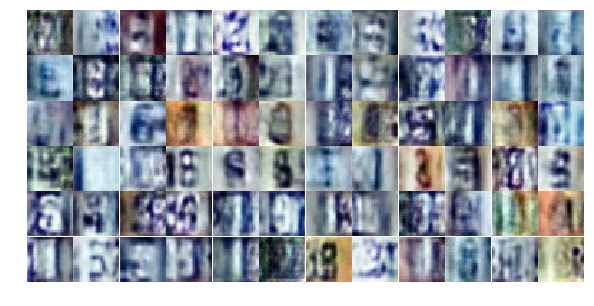

Epoch 4/25... Discriminator Loss: 0.2771... Generator Loss: 2.2000
Epoch 4/25... Discriminator Loss: 0.6453... Generator Loss: 1.8542
Epoch 4/25... Discriminator Loss: 0.4618... Generator Loss: 1.4289
Epoch 4/25... Discriminator Loss: 0.6497... Generator Loss: 1.0436
Epoch 4/25... Discriminator Loss: 0.2897... Generator Loss: 2.9875
Epoch 4/25... Discriminator Loss: 0.3047... Generator Loss: 2.2463
Epoch 4/25... Discriminator Loss: 2.1236... Generator Loss: 4.5461
Epoch 4/25... Discriminator Loss: 0.6387... Generator Loss: 1.1272
Epoch 4/25... Discriminator Loss: 0.2907... Generator Loss: 2.2005
Epoch 4/25... Discriminator Loss: 0.4580... Generator Loss: 1.4381


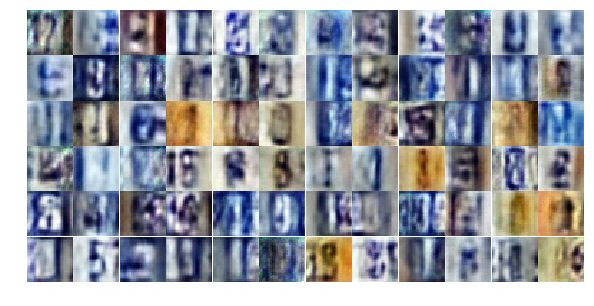

Epoch 4/25... Discriminator Loss: 0.2797... Generator Loss: 2.0461
Epoch 4/25... Discriminator Loss: 1.3125... Generator Loss: 0.4628
Epoch 4/25... Discriminator Loss: 0.4446... Generator Loss: 1.9687
Epoch 4/25... Discriminator Loss: 0.8012... Generator Loss: 4.1096
Epoch 4/25... Discriminator Loss: 0.2808... Generator Loss: 1.8529
Epoch 4/25... Discriminator Loss: 0.5572... Generator Loss: 1.6003
Epoch 4/25... Discriminator Loss: 0.9339... Generator Loss: 3.3940
Epoch 4/25... Discriminator Loss: 0.4606... Generator Loss: 2.1312
Epoch 4/25... Discriminator Loss: 1.2067... Generator Loss: 0.5047
Epoch 4/25... Discriminator Loss: 0.6657... Generator Loss: 1.1713


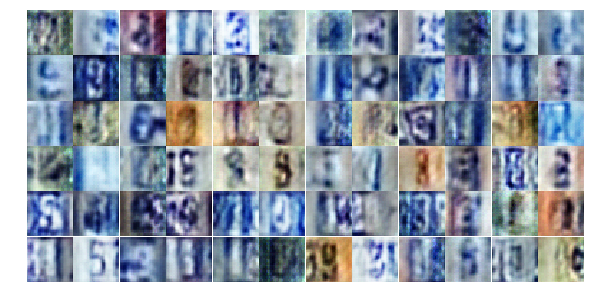

Epoch 4/25... Discriminator Loss: 0.4652... Generator Loss: 1.8342
Epoch 4/25... Discriminator Loss: 0.2675... Generator Loss: 2.2369
Epoch 4/25... Discriminator Loss: 0.1929... Generator Loss: 2.7159
Epoch 4/25... Discriminator Loss: 0.4562... Generator Loss: 3.5511
Epoch 4/25... Discriminator Loss: 0.4387... Generator Loss: 1.5138
Epoch 4/25... Discriminator Loss: 0.3415... Generator Loss: 2.1762
Epoch 4/25... Discriminator Loss: 0.5233... Generator Loss: 1.1578
Epoch 4/25... Discriminator Loss: 0.5714... Generator Loss: 1.1223
Epoch 4/25... Discriminator Loss: 0.2933... Generator Loss: 1.9368
Epoch 5/25... Discriminator Loss: 0.4607... Generator Loss: 1.3560


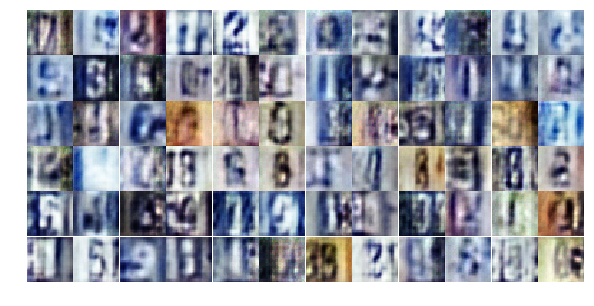

Epoch 5/25... Discriminator Loss: 0.1952... Generator Loss: 2.3144
Epoch 5/25... Discriminator Loss: 0.4215... Generator Loss: 2.3201
Epoch 5/25... Discriminator Loss: 0.5182... Generator Loss: 2.6648
Epoch 5/25... Discriminator Loss: 0.3527... Generator Loss: 1.8110
Epoch 5/25... Discriminator Loss: 0.1404... Generator Loss: 3.8459
Epoch 5/25... Discriminator Loss: 0.3267... Generator Loss: 2.1607
Epoch 5/25... Discriminator Loss: 0.2935... Generator Loss: 1.9632
Epoch 5/25... Discriminator Loss: 0.3000... Generator Loss: 2.1095
Epoch 5/25... Discriminator Loss: 0.4031... Generator Loss: 1.5297
Epoch 5/25... Discriminator Loss: 0.2872... Generator Loss: 1.9110


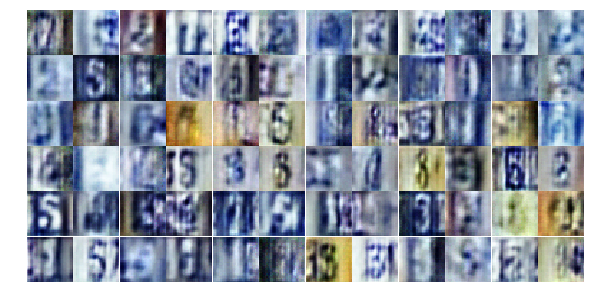

Epoch 5/25... Discriminator Loss: 0.2159... Generator Loss: 2.2200
Epoch 5/25... Discriminator Loss: 0.2385... Generator Loss: 2.6832
Epoch 5/25... Discriminator Loss: 0.1584... Generator Loss: 2.7313
Epoch 5/25... Discriminator Loss: 0.1997... Generator Loss: 2.4096
Epoch 5/25... Discriminator Loss: 0.2883... Generator Loss: 2.3175
Epoch 5/25... Discriminator Loss: 0.5997... Generator Loss: 3.1396
Epoch 5/25... Discriminator Loss: 1.6315... Generator Loss: 0.4232
Epoch 5/25... Discriminator Loss: 0.8920... Generator Loss: 3.7825
Epoch 5/25... Discriminator Loss: 0.4351... Generator Loss: 1.5452
Epoch 5/25... Discriminator Loss: 0.1734... Generator Loss: 2.8480


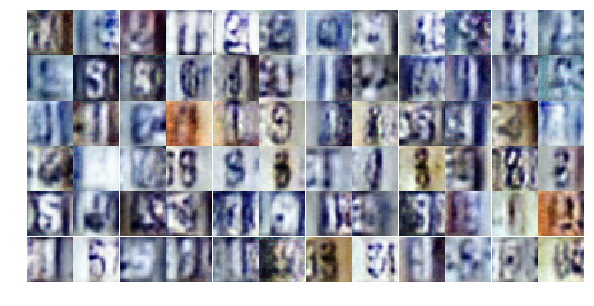

Epoch 5/25... Discriminator Loss: 0.2947... Generator Loss: 2.6751
Epoch 5/25... Discriminator Loss: 0.3988... Generator Loss: 2.9584
Epoch 5/25... Discriminator Loss: 0.3489... Generator Loss: 1.5339
Epoch 5/25... Discriminator Loss: 0.3502... Generator Loss: 1.6977
Epoch 5/25... Discriminator Loss: 0.5429... Generator Loss: 1.2016
Epoch 5/25... Discriminator Loss: 1.3349... Generator Loss: 0.4612
Epoch 5/25... Discriminator Loss: 0.6139... Generator Loss: 1.1390
Epoch 5/25... Discriminator Loss: 0.5220... Generator Loss: 4.2979
Epoch 5/25... Discriminator Loss: 0.5905... Generator Loss: 1.3146
Epoch 5/25... Discriminator Loss: 0.3284... Generator Loss: 2.9961


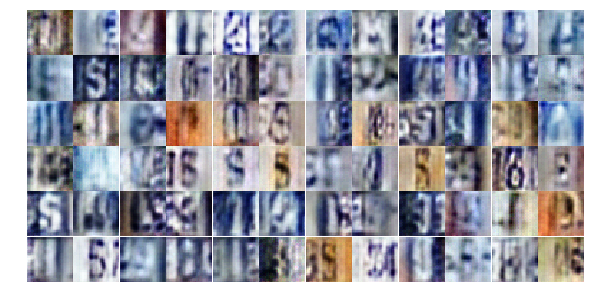

Epoch 5/25... Discriminator Loss: 0.2852... Generator Loss: 1.8717
Epoch 5/25... Discriminator Loss: 0.3438... Generator Loss: 2.0558
Epoch 5/25... Discriminator Loss: 0.7419... Generator Loss: 3.2598
Epoch 5/25... Discriminator Loss: 0.1805... Generator Loss: 4.0325
Epoch 5/25... Discriminator Loss: 0.3301... Generator Loss: 1.9048
Epoch 5/25... Discriminator Loss: 0.2069... Generator Loss: 2.9687
Epoch 5/25... Discriminator Loss: 0.3198... Generator Loss: 1.8534
Epoch 5/25... Discriminator Loss: 0.3677... Generator Loss: 1.6798
Epoch 5/25... Discriminator Loss: 0.2715... Generator Loss: 2.6578
Epoch 5/25... Discriminator Loss: 0.3750... Generator Loss: 1.5333


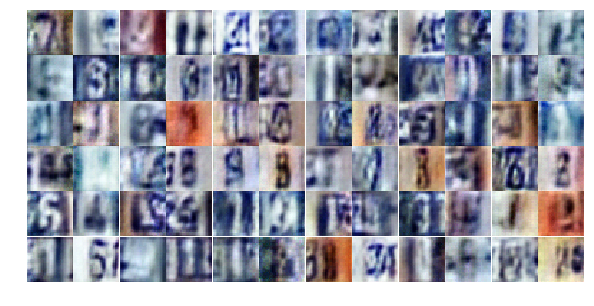

Epoch 5/25... Discriminator Loss: 0.1839... Generator Loss: 2.6322
Epoch 5/25... Discriminator Loss: 0.1275... Generator Loss: 2.8736
Epoch 5/25... Discriminator Loss: 0.7154... Generator Loss: 0.9158
Epoch 5/25... Discriminator Loss: 0.6489... Generator Loss: 0.9925
Epoch 5/25... Discriminator Loss: 0.5272... Generator Loss: 2.0111
Epoch 5/25... Discriminator Loss: 1.3618... Generator Loss: 4.2529
Epoch 5/25... Discriminator Loss: 0.3601... Generator Loss: 2.3180
Epoch 5/25... Discriminator Loss: 0.3875... Generator Loss: 1.4931
Epoch 5/25... Discriminator Loss: 0.3921... Generator Loss: 1.9235
Epoch 5/25... Discriminator Loss: 0.3655... Generator Loss: 3.5746


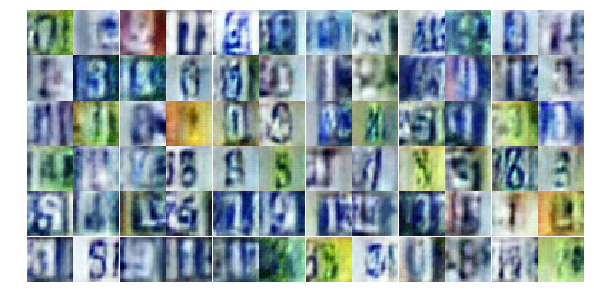

Epoch 5/25... Discriminator Loss: 1.1837... Generator Loss: 0.6080
Epoch 5/25... Discriminator Loss: 0.6088... Generator Loss: 1.1800
Epoch 5/25... Discriminator Loss: 0.1101... Generator Loss: 3.4788
Epoch 5/25... Discriminator Loss: 0.1817... Generator Loss: 2.6390
Epoch 5/25... Discriminator Loss: 0.3606... Generator Loss: 1.9789
Epoch 5/25... Discriminator Loss: 0.4591... Generator Loss: 1.6032
Epoch 6/25... Discriminator Loss: 0.4303... Generator Loss: 1.3728
Epoch 6/25... Discriminator Loss: 0.7025... Generator Loss: 1.0423
Epoch 6/25... Discriminator Loss: 0.4513... Generator Loss: 1.3491
Epoch 6/25... Discriminator Loss: 0.3288... Generator Loss: 2.5988


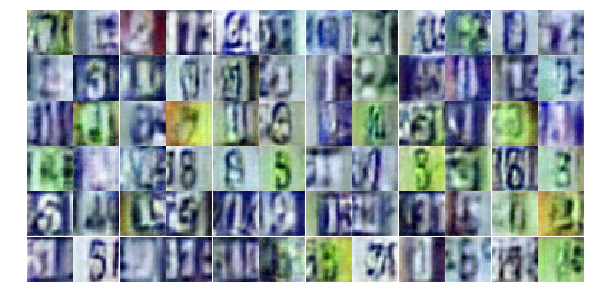

Epoch 6/25... Discriminator Loss: 0.1954... Generator Loss: 2.5043
Epoch 6/25... Discriminator Loss: 1.4718... Generator Loss: 0.4118
Epoch 6/25... Discriminator Loss: 0.7511... Generator Loss: 2.8835
Epoch 6/25... Discriminator Loss: 1.5371... Generator Loss: 0.3729
Epoch 6/25... Discriminator Loss: 0.5456... Generator Loss: 1.3157
Epoch 6/25... Discriminator Loss: 0.1684... Generator Loss: 3.4252
Epoch 6/25... Discriminator Loss: 0.3219... Generator Loss: 2.5988
Epoch 6/25... Discriminator Loss: 0.0769... Generator Loss: 4.9309
Epoch 6/25... Discriminator Loss: 0.1959... Generator Loss: 2.6371
Epoch 6/25... Discriminator Loss: 0.1416... Generator Loss: 3.2542


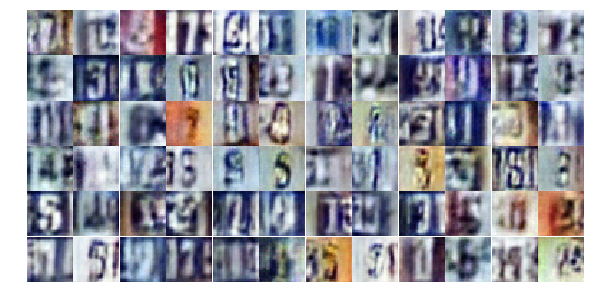

Epoch 6/25... Discriminator Loss: 0.4832... Generator Loss: 3.8656
Epoch 6/25... Discriminator Loss: 1.4990... Generator Loss: 4.0375
Epoch 6/25... Discriminator Loss: 0.4221... Generator Loss: 1.4969
Epoch 6/25... Discriminator Loss: 0.1162... Generator Loss: 3.3773
Epoch 6/25... Discriminator Loss: 0.5134... Generator Loss: 1.2701
Epoch 6/25... Discriminator Loss: 0.1516... Generator Loss: 3.5928
Epoch 6/25... Discriminator Loss: 0.1920... Generator Loss: 2.6696
Epoch 6/25... Discriminator Loss: 2.2498... Generator Loss: 0.2048
Epoch 6/25... Discriminator Loss: 0.4841... Generator Loss: 3.3581
Epoch 6/25... Discriminator Loss: 0.3404... Generator Loss: 2.2278


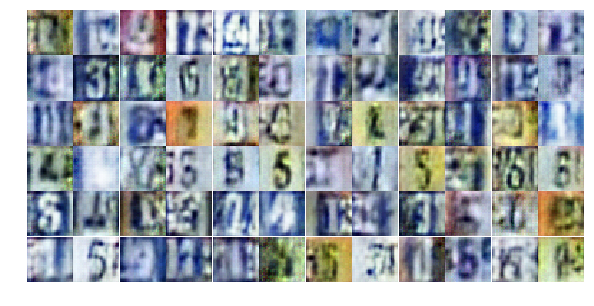

Epoch 6/25... Discriminator Loss: 0.2733... Generator Loss: 2.2957
Epoch 6/25... Discriminator Loss: 0.8924... Generator Loss: 0.6973
Epoch 6/25... Discriminator Loss: 0.3238... Generator Loss: 1.8461
Epoch 6/25... Discriminator Loss: 0.4216... Generator Loss: 1.4276
Epoch 6/25... Discriminator Loss: 0.3031... Generator Loss: 2.4434
Epoch 6/25... Discriminator Loss: 0.3989... Generator Loss: 2.8417
Epoch 6/25... Discriminator Loss: 0.2593... Generator Loss: 2.2446
Epoch 6/25... Discriminator Loss: 0.1283... Generator Loss: 3.1561
Epoch 6/25... Discriminator Loss: 0.1558... Generator Loss: 2.8131
Epoch 6/25... Discriminator Loss: 0.6401... Generator Loss: 0.9846


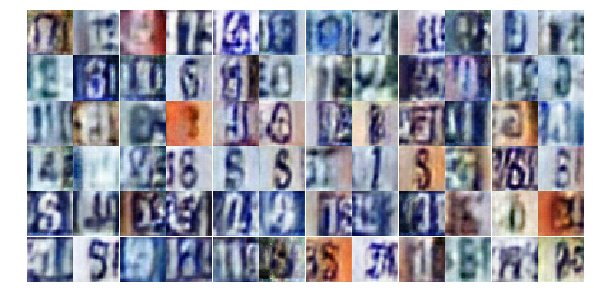

Epoch 6/25... Discriminator Loss: 0.1842... Generator Loss: 2.5101
Epoch 6/25... Discriminator Loss: 0.2765... Generator Loss: 2.1485
Epoch 6/25... Discriminator Loss: 0.2408... Generator Loss: 2.5751
Epoch 6/25... Discriminator Loss: 0.1629... Generator Loss: 3.3239
Epoch 6/25... Discriminator Loss: 0.1647... Generator Loss: 2.8764
Epoch 6/25... Discriminator Loss: 0.2576... Generator Loss: 1.8592
Epoch 6/25... Discriminator Loss: 0.4904... Generator Loss: 1.3106
Epoch 6/25... Discriminator Loss: 0.3152... Generator Loss: 1.6316
Epoch 6/25... Discriminator Loss: 0.2105... Generator Loss: 2.3110
Epoch 6/25... Discriminator Loss: 0.1373... Generator Loss: 4.4885


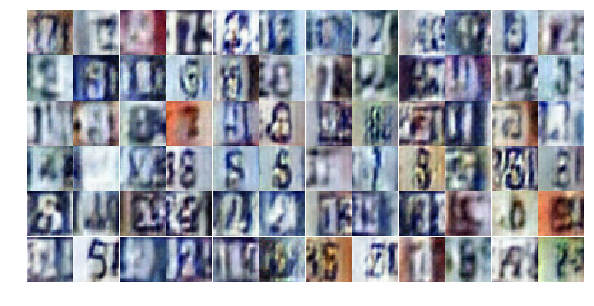

Epoch 6/25... Discriminator Loss: 0.2692... Generator Loss: 2.2586
Epoch 6/25... Discriminator Loss: 2.5552... Generator Loss: 0.1944
Epoch 6/25... Discriminator Loss: 0.8942... Generator Loss: 0.9344
Epoch 6/25... Discriminator Loss: 0.7201... Generator Loss: 1.0639
Epoch 6/25... Discriminator Loss: 0.6655... Generator Loss: 1.0246
Epoch 6/25... Discriminator Loss: 0.2286... Generator Loss: 3.1408
Epoch 6/25... Discriminator Loss: 0.8317... Generator Loss: 0.9631
Epoch 6/25... Discriminator Loss: 1.7307... Generator Loss: 0.2866
Epoch 6/25... Discriminator Loss: 1.3942... Generator Loss: 0.3894
Epoch 6/25... Discriminator Loss: 1.2517... Generator Loss: 0.4505


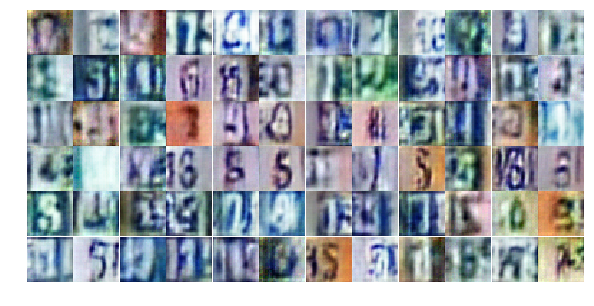

Epoch 6/25... Discriminator Loss: 0.6856... Generator Loss: 1.0178
Epoch 6/25... Discriminator Loss: 0.2452... Generator Loss: 2.3579
Epoch 6/25... Discriminator Loss: 0.5384... Generator Loss: 2.2283
Epoch 7/25... Discriminator Loss: 0.2617... Generator Loss: 2.1552
Epoch 7/25... Discriminator Loss: 0.3436... Generator Loss: 3.2594
Epoch 7/25... Discriminator Loss: 0.1885... Generator Loss: 4.5546
Epoch 7/25... Discriminator Loss: 0.4937... Generator Loss: 1.3513
Epoch 7/25... Discriminator Loss: 0.2207... Generator Loss: 2.9591
Epoch 7/25... Discriminator Loss: 0.2273... Generator Loss: 3.6423
Epoch 7/25... Discriminator Loss: 0.5268... Generator Loss: 1.3145


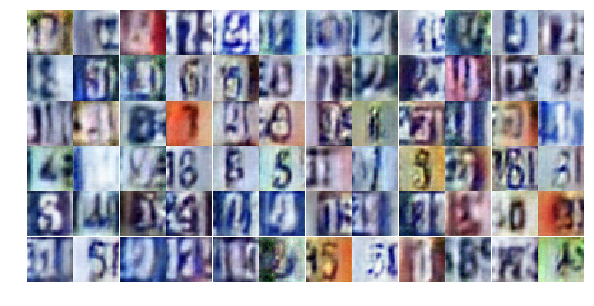

Epoch 7/25... Discriminator Loss: 0.4419... Generator Loss: 4.0814
Epoch 7/25... Discriminator Loss: 0.1886... Generator Loss: 4.4111
Epoch 7/25... Discriminator Loss: 0.5880... Generator Loss: 1.0704
Epoch 7/25... Discriminator Loss: 0.2497... Generator Loss: 2.3424
Epoch 7/25... Discriminator Loss: 0.6347... Generator Loss: 1.0413
Epoch 7/25... Discriminator Loss: 0.6341... Generator Loss: 1.0229
Epoch 7/25... Discriminator Loss: 0.5224... Generator Loss: 1.3431
Epoch 7/25... Discriminator Loss: 0.7489... Generator Loss: 3.9221
Epoch 7/25... Discriminator Loss: 1.4811... Generator Loss: 3.6669
Epoch 7/25... Discriminator Loss: 0.1978... Generator Loss: 2.6597


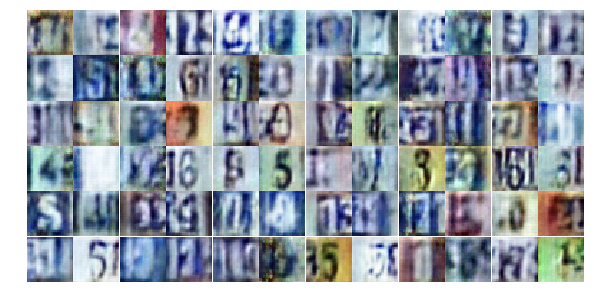

Epoch 7/25... Discriminator Loss: 0.7075... Generator Loss: 3.4133
Epoch 7/25... Discriminator Loss: 1.1026... Generator Loss: 0.5773
Epoch 7/25... Discriminator Loss: 0.2777... Generator Loss: 1.9953
Epoch 7/25... Discriminator Loss: 0.2084... Generator Loss: 2.6967
Epoch 7/25... Discriminator Loss: 0.4557... Generator Loss: 1.4108
Epoch 7/25... Discriminator Loss: 0.2918... Generator Loss: 3.3747
Epoch 7/25... Discriminator Loss: 1.0406... Generator Loss: 0.5938
Epoch 7/25... Discriminator Loss: 1.4505... Generator Loss: 0.3635
Epoch 7/25... Discriminator Loss: 0.2592... Generator Loss: 2.9880
Epoch 7/25... Discriminator Loss: 0.3512... Generator Loss: 3.5973


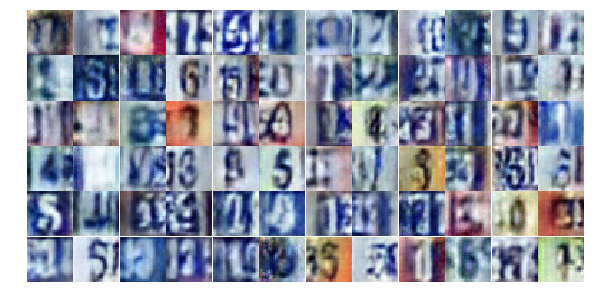

Epoch 7/25... Discriminator Loss: 0.7526... Generator Loss: 0.8466
Epoch 7/25... Discriminator Loss: 0.9252... Generator Loss: 2.5516
Epoch 7/25... Discriminator Loss: 0.5534... Generator Loss: 1.1964
Epoch 7/25... Discriminator Loss: 0.4671... Generator Loss: 1.3574
Epoch 7/25... Discriminator Loss: 1.0871... Generator Loss: 0.5623
Epoch 7/25... Discriminator Loss: 1.2925... Generator Loss: 0.4512
Epoch 7/25... Discriminator Loss: 0.5131... Generator Loss: 1.4448
Epoch 7/25... Discriminator Loss: 0.4026... Generator Loss: 1.6191
Epoch 7/25... Discriminator Loss: 0.3676... Generator Loss: 1.9343
Epoch 7/25... Discriminator Loss: 0.4138... Generator Loss: 6.7985


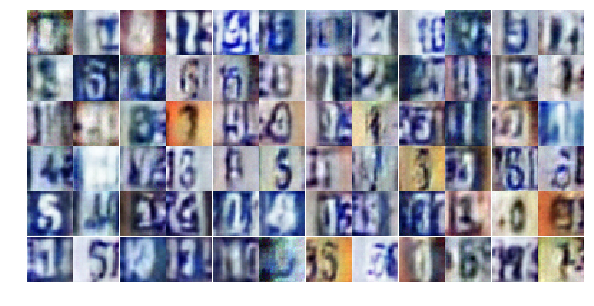

Epoch 7/25... Discriminator Loss: 0.4792... Generator Loss: 1.4354
Epoch 7/25... Discriminator Loss: 0.3862... Generator Loss: 1.6651
Epoch 7/25... Discriminator Loss: 0.0755... Generator Loss: 3.9518
Epoch 7/25... Discriminator Loss: 0.3642... Generator Loss: 1.6195
Epoch 7/25... Discriminator Loss: 0.5093... Generator Loss: 2.1278
Epoch 7/25... Discriminator Loss: 0.2151... Generator Loss: 2.5286
Epoch 7/25... Discriminator Loss: 0.1240... Generator Loss: 3.5691
Epoch 7/25... Discriminator Loss: 1.8533... Generator Loss: 0.2817
Epoch 7/25... Discriminator Loss: 0.8534... Generator Loss: 1.5237
Epoch 7/25... Discriminator Loss: 1.5988... Generator Loss: 3.3054


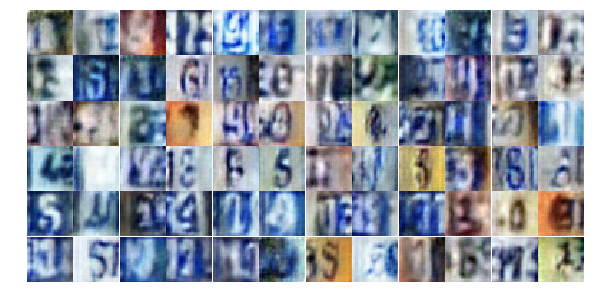

Epoch 7/25... Discriminator Loss: 0.6669... Generator Loss: 2.4704
Epoch 7/25... Discriminator Loss: 0.9273... Generator Loss: 0.7583
Epoch 7/25... Discriminator Loss: 0.5057... Generator Loss: 1.7475


In [ ]:
dataset = Dataset(trainset, testset)

losses, samples = train(net, dataset, epochs, batch_size, figsize=(10,5))

In [ ]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

In [ ]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

In [ ]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))

In [ ]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))